In [0]:
import keras
from keras.datasets import mnist
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D ,Conv2DTranspose,Reshape,Lambda
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from keras import metrics
import os
import random
import cv2
import pandas as pd


# **DOWNLOAD FILES AND IMAGES**

In [0]:
!curl --header "Host: doc-0o-cc-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/77.0.3865.120 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header "Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,mr;q=0.6,hi;q=0.5,pa;q=0.4" --header "Referer: https://drive.google.com/drive/folders/0B7EVK8r0v71pTUZsaXdaSnZBZzg" --header "Cookie: AUTH_9npas8v085f52vaubcl759qle1361bvr_nonce=g74i2nem7b732" --header "Connection: keep-alive" "https://doc-0o-cc-docs.googleusercontent.com/docs/securesc/ofs2hoambqh75itiu2ihkjmqnr3s6pig/12atmefdhc44ipqhfbitmj4ep5ueartn/1571544000000/13182073909007362810/04376228251861736213/0B7EVK8r0v71pZjFTYXZWM3FlRnM?e=download&nonce=g74i2nem7b732&user=04376228251861736213&hash=ef0t4s5uo53su4a5aporjheo1vhoccbo" -o "img_align_celeba.zip" -L

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1376M    0 1376M    0     0  69.9M      0 --:--:--  0:00:19 --:--:-- 99.2M


In [0]:
!unzip img_align_celeba.zip

In [0]:
!curl --header "Host: doc-0k-cc-docs.googleusercontent.com" --header "User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/77.0.3865.120 Safari/537.36" --header "Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3" --header "Accept-Language: en-IN,en-GB;q=0.9,en-US;q=0.8,en;q=0.7,mr;q=0.6,hi;q=0.5,pa;q=0.4" --header "Referer: https://drive.google.com/drive/folders/0B7EVK8r0v71pOC0wOVZlQnFfaGs" --header "Cookie: AUTH_9npas8v085f52vaubcl759qle1361bvr=04376228251861736213|1571544000000|fhigb6ocsd3h8og5rricbk4t6tuuo85e" --header "Connection: keep-alive" "https://doc-0k-cc-docs.googleusercontent.com/docs/securesc/ofs2hoambqh75itiu2ihkjmqnr3s6pig/hal8pjsulsigrr9ek6nbevn0bkp6d2mo/1571551200000/13182073909007362810/04376228251861736213/0B7EVK8r0v71pblRyaVFSWGxPY0U?e=download" -o "list_attr_celeba.txt" -L

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 25.4M    0 25.4M    0     0  17.8M      0 --:--:--  0:00:01 --:--:-- 17.8M


**CREATING STRUCTURED DATA**

In [0]:
images=os.listdir('/content/img_align_celeba')

In [0]:
image_path=[]
for img in images:
  image_path.append("/content/img_align_celeba/"+img)



In [251]:
cv2.imread(image_path[0]).shape.flatten()

AttributeError: ignored

In [0]:
contents=[]
with open('/content/list_attr_celeba.txt', 'r') as fh:
    for line in fh:
        contents.append(line)

In [0]:
categories=contents[1].split(" ")[:-1:]
len(categories)

40

In [0]:
image_name=[]
attributes=[]
for lines in contents[2:]:
  line=lines.split()
  image_name.append(line[0])
  attributes.append(line[1:])



In [0]:
attributes=np.array(attributes,dtype=int)

In [0]:
attributes.shape

(202599, 40)

In [0]:
df=pd.DataFrame(columns=[categories],data=attributes)

In [0]:
image_path=[]
for img in image_name:
  image_path.append("/content/img_align_celeba/"+img)

In [0]:
df['file']=image_path


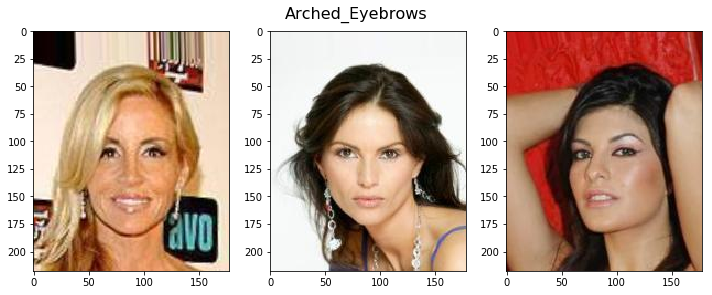

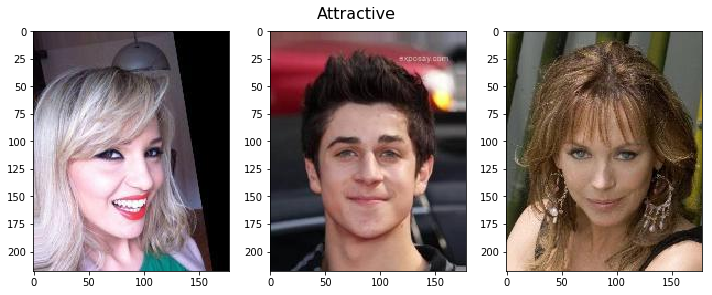

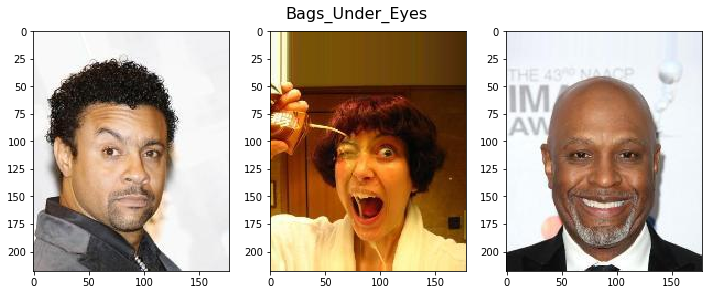

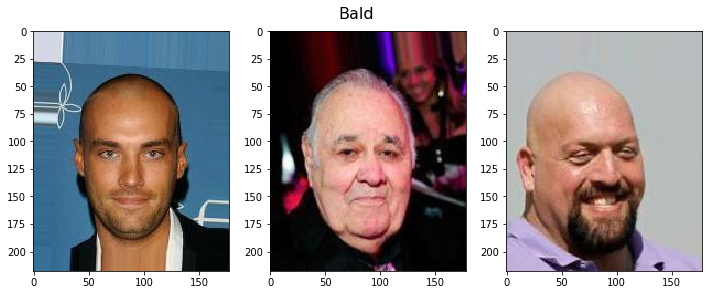

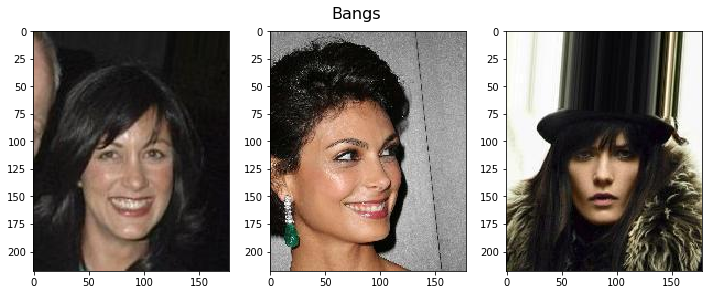

...

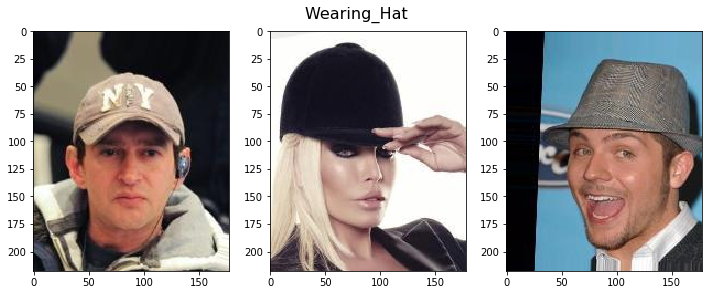

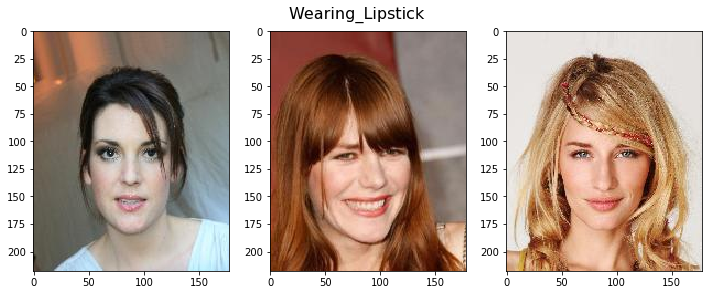

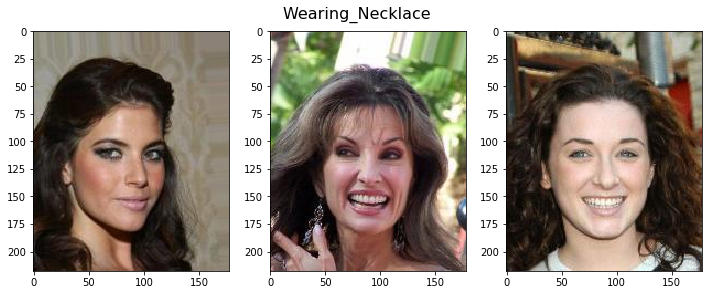

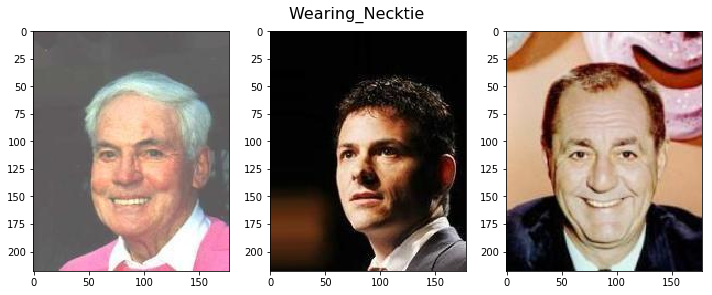

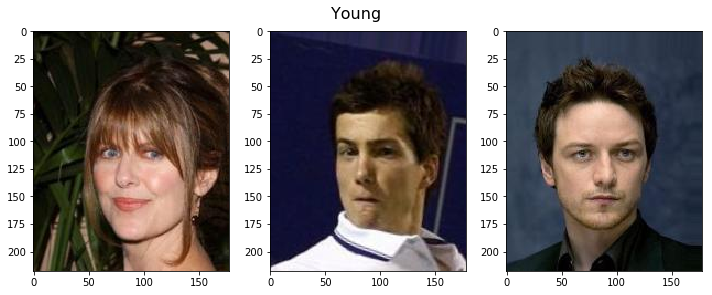

In [0]:
for i in range(1,40):
    images=df[df.iloc[:,i]==1]['file'].values
    images=images.reshape(images.shape[0],)
    images=random.choices(images,k=3)
    fig,axes = plt.subplots(1, 3,figsize=(10,10))
    for j in range(3):
      image=cv2.imread(images[j])
      image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      axes[j].imshow(image)
    fig.suptitle(categories[i],size=16,y=0.7)  
    plt.tight_layout()
    plt.show()  

**GENERATORS FOR DATA LOADING**

In [0]:
import shutil
for img in image_path:
  shutil.move(img,'/content/train_images/0')

In [0]:
os.mkdir("train_images/0")

In [0]:
from keras.preprocessing.image import ImageDataGenerator

In [0]:
train_datagen = ImageDataGenerator(
rescale = 1./255)

In [298]:
train_it = train_datagen.flow_from_directory('/content/train_images',batch_size=32,target_size=(128,128),class_mode = 'input'
                                         , subset = "training")

Found 202599 images belonging to 1 classes.


**ENCODER**

In [0]:
def sampling(args):
    mu, log_var = args
    epsilon = K.random_normal(shape=K.shape(mu), mean=0., stddev=1.)
    return mu + K.exp(log_var / 2) * epsilon

In [0]:
from keras.layers import Input
from keras.layers import MaxPool2D
from keras.layers import Conv2D,Dense,Conv2DTranspose,BatchNormalization,Dropout
from keras.models import Model

image_input=Input(shape=(128,128,3))

x=Conv2D(32, (3, 3), padding='same',activation='relu',name='Conv_1',strides=(2,2))(image_input)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)
x=Conv2D(64, (3, 3), padding='same',activation='relu',name='Conv_2',strides=(2,2))(x)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)
x=Conv2D(64, (3, 3), padding='same',activation='relu',name='Conv_3',strides=(2,2))(x)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)
x=Conv2D(64, (3, 3), padding='same',activation='relu',name='Conv_4',strides=(2,2))(x)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)
x=Flatten()(x)
mean_v=Dense(200, name='mean_output')(x)
std_v=Dense(200, name='variance_output')(x)

encoder_output = Lambda(sampling, name='encoder_output')([mean_v,std_v])

encoder=Model(image_input,encoder_output)


In [320]:
encoder.summary()

Model: "model_46"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
Conv_1 (Conv2D)                 (None, 64, 64, 32)   896         input_35[0][0]                   
__________________________________________________________________________________________________
batch_normalization_115 (BatchN (None, 64, 64, 32)   128         Conv_1[0][0]                     
__________________________________________________________________________________________________
dropout_115 (Dropout)           (None, 64, 64, 32)   0           batch_normalization_115[0][0]    
___________________________________________________________________________________________

**DECODER**

In [0]:

latent_input=Input(shape=(200,))
output=Dense(4096, name='encoder_output')(latent_input)
x=Reshape(target_shape=(8, 8, 64))(output)

x=Conv2DTranspose(64, (3, 3), padding='same',activation='relu',name='Conv_1',strides=(2,2))(x)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)

x=Conv2DTranspose(64, (3, 3), padding='same',activation='relu',name='Conv_2',strides=(2,2))(x)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)

x=Conv2DTranspose(32, (3, 3), padding='same',activation='relu',name='Conv_5',strides=(2,2))(x)
x=BatchNormalization()(x)
x=Dropout(0.3)(x)

output=Conv2DTranspose(3, (3, 3), padding='same',activation='relu',name='Conv_6',strides=(2,2))(x)

decoder=Model(latent_input,output)

In [322]:
decoder.summary()

Model: "model_47"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_36 (InputLayer)        (None, 200)               0         
_________________________________________________________________
encoder_output (Dense)       (None, 4096)              823296    
_________________________________________________________________
reshape_19 (Reshape)         (None, 8, 8, 64)          0         
_________________________________________________________________
Conv_1 (Conv2DTranspose)     (None, 16, 16, 64)        36928     
_________________________________________________________________
batch_normalization_119 (Bat (None, 16, 16, 64)        256       
_________________________________________________________________
dropout_119 (Dropout)        (None, 16, 16, 64)        0         
_________________________________________________________________
Conv_2 (Conv2DTranspose)     (None, 32, 32, 64)        369

In [0]:
decoder_output=decoder(encoder_output)
main_model=Model(image_input,decoder_output)

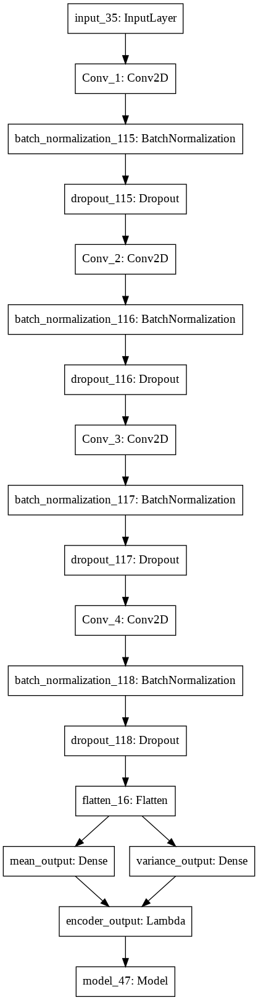

In [324]:
from keras.utils import plot_model
plot_model(main_model, to_file='model.png')

**LOSS FUNCTIONS**

In [0]:
def vae_loss(x, x_decoded_mean):
    xent_loss =keras.losses.binary_crossentropy(K.flatten(x), K.flatten(x_decoded_mean))
    xent_loss *= 10000
    kl_loss =  -0.5 * K.sum(1 + std_v - K.square(mean_v) - K.exp(std_v), axis = 1)
    return xent_loss + kl_loss

In [0]:
main_model.compile(optimizer=keras.optimizers.Adam(lr=0.001), loss=vae_loss)

In [0]:
from keras.callbacks import ReduceLROnPlateau
reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.5,
                              patience=2, min_lr=0.000001)

In [328]:
df.shape

(202599, 41)

In [0]:
main_model.fit_generator(train_it,steps_per_epoch=df.shape[0]/32,shuffle = True,epochs =50)

Epoch 1/50
6332/6331 [==============================] - 464s 73ms/step - loss: 8283.3365
Epoch 2/50
2651/6331 [===========>..................] - ETA: 4:25 - loss: 6822.6246

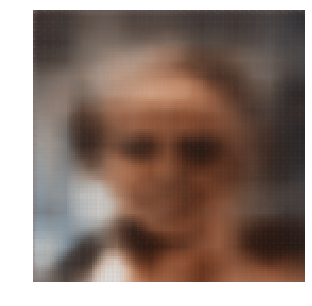

In [317]:
n_to_show = 1

znew = np.random.normal(size = (n_to_show,200))

reconst = decoder.predict(np.array(znew))

fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(n_to_show):
    ax = fig.add_subplot(1,1, i+1)
    ax.imshow(reconst[i, :,:,:])
    ax.axis('off')

plt.show()